In [1]:
import os
os.environ["PYTHONWARNINGS"] = "ignore"

In [2]:
import warnings
warnings.filterwarnings("ignore")

In [3]:
import scanpy as sc
import spottedpy as sp
import numpy as np

from tqdm import tqdm
from sklearn.preprocessing import MinMaxScaler

In [4]:
sc.settings.set_figure_params(frameon=False)
sc.settings._vector_friendly = False

In [5]:
# Load the anndata object
adata_full = sc.read_h5ad("data/visium_adata.h5ad")

In [6]:
adata_full.X = adata_full.layers["counts"].copy()
sc.pp.normalize_total(adata_full, target_sum=1e4)
adata_full.X = np.log1p(adata_full.X)

In [7]:
import pickle

with open("gene_sets.pkl", "rb") as f:
    quiescence_genesets = pickle.load(f)

In [8]:
tumour_adata = adata_full[adata_full.obs["tumour_cells"] == 1].copy()
tumour_adata.X = tumour_adata.layers["counts"].copy()
sc.pp.filter_genes(tumour_adata, min_cells=1)
sc.pp.normalize_total(tumour_adata, target_sum=1e4)
tumour_adata.X = np.log1p(tumour_adata.X)

In [9]:
from calculate_quiescence_score import score_quiescence

score_quiescence(
    tumour_adata,
    up_genes=quiescence_genesets["upregulated"],
    down_genes=quiescence_genesets["downregulated"]
    )

adata_full.obs.loc[adata_full.obs["tumour_cells"] == 1, "quiescence_score"] = (tumour_adata.obs["quiescence_score"])

In [10]:
q25, q75 = adata_full.obs["quiescence_score"].quantile([0.25, 0.75])

# Create "G0_arrested" column: assign values where "quiescence" > Q75, otherwise 0
adata_full.obs["G0_arrested"] = adata_full.obs["quiescence_score"].where(adata_full.obs["quiescence_score"] > q75, 0)

# Create "Fast_cycling" column: assign negative values where "quiescence" < Q25, otherwise 0
adata_full.obs["Fast_cycling"] = adata_full.obs["quiescence_score"].where(adata_full.obs["quiescence_score"] < q25, 0) * -1

# Create "Intermediate" column: assign values where "quiescence" is between Q25 and Q75, otherwise 0
adata_full.obs["Slow_cycling"] = adata_full.obs["quiescence_score"].where((adata_full.obs["quiescence_score"] >= q25) & (adata_full.obs["quiescence_score"] <= q75), 0)

In [11]:
# Cell type labels
cell_type_labels = [
    "B cells Memory",
    "B cells Naive",
    "CAFs MSC iCAF-like s1",
    "CAFs MSC iCAF-like s2",
    "CAFs Transitioning s3",
    "CAFs myCAF like s4",
    "CAFs myCAF like s5",
    "Cycling PVL",
    "Cycling_Myeloid",
    "Endothelial ACKR1",
    "Endothelial CXCL12",
    "Endothelial Lymphatic LYVE1",
    "Endothelial RGS5",
    "Myeloid_c0_DC_LAMP3",
    "Myeloid_c10_Macrophage_1_EGR1",
    "Myeloid_c11_cDC2_CD1C",
    "Myeloid_c12_Monocyte_1_IL1B",
    "Myeloid_c1_LAM1_FABP5",
    "Myeloid_c2_LAM2_APOE",
    "Myeloid_c3_cDC1_CLEC9A",
    "Myeloid_c4_DCs_pDC_IRF7",
    "Myeloid_c5_Macrophage_3_SIGLEC1",
    "Myeloid_c7_Monocyte_3_FCGR3A",
    "Myeloid_c8_Monocyte_2_S100A9",
    "Myeloid_c9_Macrophage_2_CXCL10",
    "PVL Differentiated s3",
    "PVL Immature s1",
    "PVL_Immature s2",
    "Plasmablasts",
    "T_cells_c0_CD4+_CCR7",
    "T_cells_c10_NKT_cells_FCGR3A",
    "T_cells_c11_MKI67",
    "T_cells_c1_CD4+_IL7R",
    "T_cells_c2_CD4+_T-regs_FOXP3",
    "T_cells_c3_CD4+_Tfh_CXCL13",
    "T_cells_c4_CD8+_ZFP36",
    "T_cells_c5_CD8+_GZMK",
    "T_cells_c6_IFIT1",
    "T_cells_c7_CD8+_IFNG",
    "T_cells_c8_CD8+_LAG3",
    "T_cells_c9_NK_cells_AREG"
]

quiescence_labels = ["G0_arrested", "Fast_cycling", "Slow_cycling"]
labels = cell_type_labels + ["Slow_cycling"]

In [12]:
adata = adata_full.copy()

In [13]:
# Define a function to scale scores
def scale_scores(adata, score_names, batch_column="batch"):
    scaler = MinMaxScaler()
    
    for batch in adata.obs[batch_column].unique():
        adata_subset = adata[adata.obs[batch_column] == batch]
        
        # Scale scores for the given score names
        adata_subset.obs[score_names] = scaler.fit_transform(adata_subset.obs[score_names])
        
        # Update the main adata object with scaled scores
        adata.obs.loc[adata.obs[batch_column] == batch, score_names] = adata_subset.obs[score_names].values

# Apply scaling to TME labels
scale_scores(adata, labels)

In [14]:
def calculate_hotspots(adata, labels, filter_columns=None, filter_value=None):
    for label in tqdm(labels):
        adata = sp.create_hotspots(
            adata,
            column_name=label,
            neighbours_parameters=6,
            relative_to_batch=True,
            number_hotspots=True,
            filter_columns=filter_columns,
            filter_value=filter_value
        )
        
    return adata

adata = calculate_hotspots(adata, quiescence_labels, filter_columns="tumour_cells", filter_value=1)
adata = calculate_hotspots(adata, cell_type_labels)

100%|██████████| 41/41 [06:34<00:00,  9.62s/it]


In [15]:
cell_type_labels_hotspots = [label + "_hot" for label in cell_type_labels]

In [16]:
# Define primary and comparison variables
primary_variables = ["G0_arrested_hot", "Fast_cycling_hot"]
comparison_variables = cell_type_labels_hotspots

# Calculate distances
distances = sp.calculateDistances(
    adata,
    primary_variables=primary_variables,
    comparison_variables=comparison_variables,
    empty_hotspot_default_to_max_distance=False,
    split_by_slide_in_batch=True,
    hotspot_number=True
)

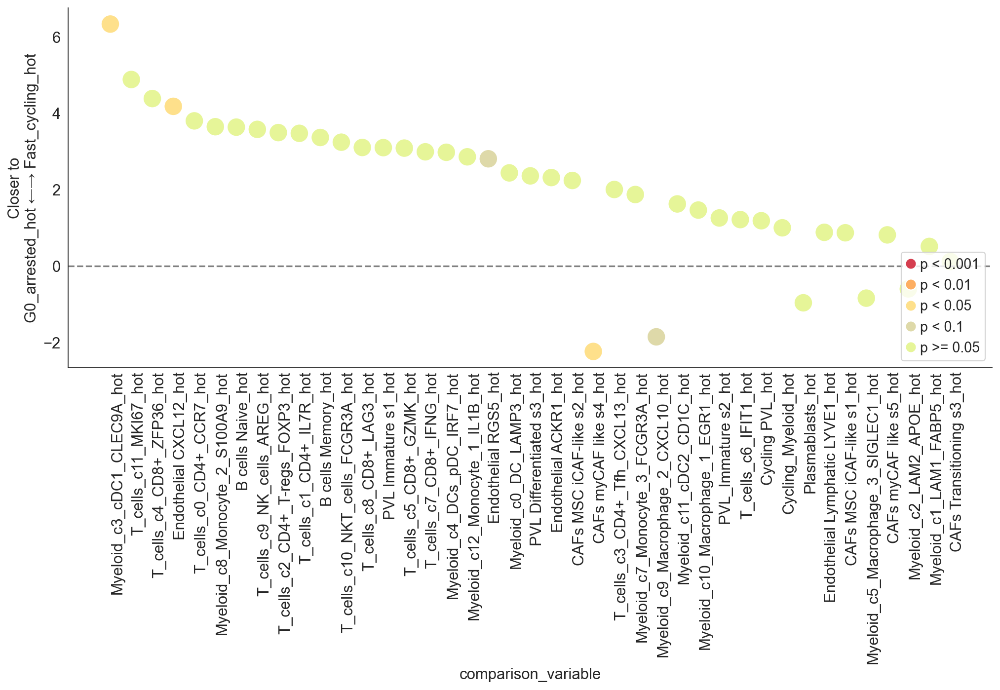

In [17]:
sp.plot_custom_scatter(data=distances,
                       primary_vars=["G0_arrested_hot", "Fast_cycling_hot"],
                       comparison_vars=cell_type_labels_hotspots,
                       bubble_size=(300, 300),
                       fig_size=(15, 6),
                       save_path=None,
                       compare_distribution_metric="median")

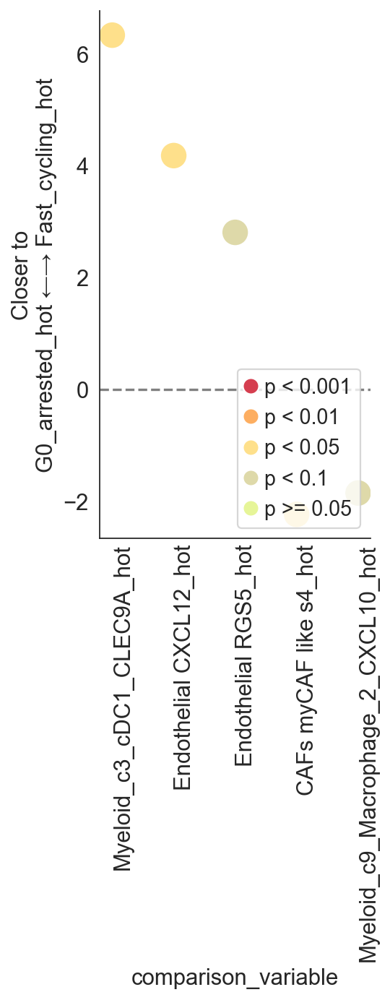

In [18]:
selected_cell_types = [
    "Myeloid_c3_cDC1_CLEC9A_hot",
    "Endothelial CXCL12_hot",
    "Endothelial RGS5_hot",
    "CAFs myCAF like s4_hot",
    "Myeloid_c9_Macrophage_2_CXCL10_hot"
]
sp.plot_custom_scatter(
    data=distances,
    primary_vars=["G0_arrested_hot", "Fast_cycling_hot"],
    comparison_vars=selected_cell_types,
    bubble_size=(300, 300),
    fig_size=(3, 6),
    save_path="figures/spottedpy_all_samples_cell_types.pdf",
    compare_distribution_metric="median",
)

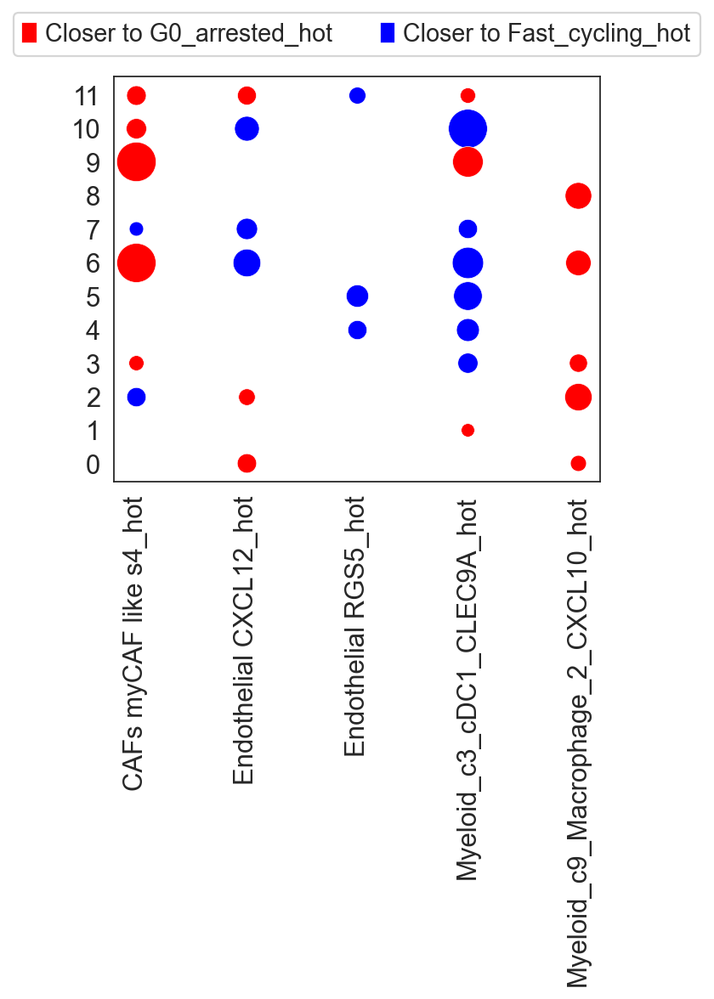

,primary_variable,comparison_variable,batch,min_distance,Difference,Pvalue
0,Fast_cycling_hot,CAFs myCAF like s4_hot,0,9.944101,0.000000,2.295395e-02
1,Fast_cycling_hot,CAFs myCAF like s4_hot,1,21.857175,0.000000,3.902559e-01
2,Fast_cycling_hot,CAFs myCAF like s4_hot,10,20.943013,0.000000,7.650206e-10
3,Fast_cycling_hot,CAFs myCAF like s4_hot,11,15.955552,0.000000,1.258948e-05
4,Fast_cycling_hot,CAFs myCAF like s4_hot,2,13.541192,0.000000,7.739393e-06
...,...,...,...,...,...,...
113,G0_arrested_hot,Myeloid_c9_Macrophage_2_CXCL10_hot,5,7.855320,-2.655938,1.216005e-01
114,G0_arrested_hot,Myeloid_c9_Macrophage_2_CXCL10_hot,6,5.283447,-8.979842,9.484191e-08
115,G0_arrested_hot,Myeloid_c9_Macrophage_2_CXCL10_hot,7,6.874857,-0.907459,2.596537e-02
116,G0_arrested_hot,Myeloid_c9_Macrophage_2_CXCL10_hot,8,23.030911,-9.892279,1.883208e-03


In [20]:
sp.plot_bubble_chart_by_batch(
    distances,
    primary_variable_value="G0_arrested_hot",
    comparison_variable_values=selected_cell_types,
    reference_variable="Fast_cycling_hot",
    save_path="bubble_chart_by_batch_selected_cell_types.pdf",
    pval_cutoff=0.05,
    fig_size=(5, 8),
)

In [21]:
from plot_multiple_hotspots import plot_multiple_hotspots

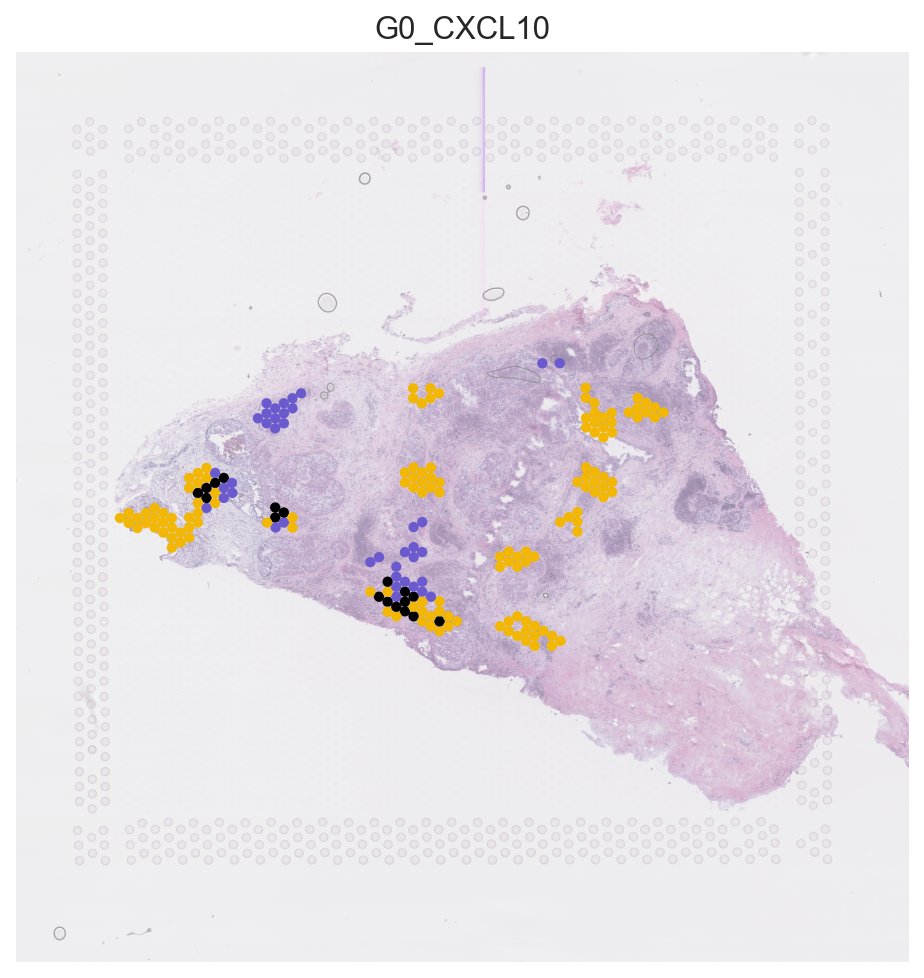

In [22]:
plot_multiple_hotspots(
    adata,
    signatures=["G0_arrested_hot", "Myeloid_c9_Macrophage_2_CXCL10_hot"],
    combined_col="G0_CXCL10",
    palette={
        "G0_arrested_hot": "#6A5ACD",
        "Myeloid_c9_Macrophage_2_CXCL10_hot": "#F2B705",
        "G0_arrested_hot+Myeloid_c9_Macrophage_2_CXCL10_hot": "#000000",
    },
    plot_kwargs={
        "library_id": "0",
        "library_key": "batch",
        "figsize": (6, 6),
        "img_alpha": 0.5,
        "legend_loc": None,
        "size": 1.6,
        "save": "spottedpy_G0_CXCL10.pdf",
    },
)

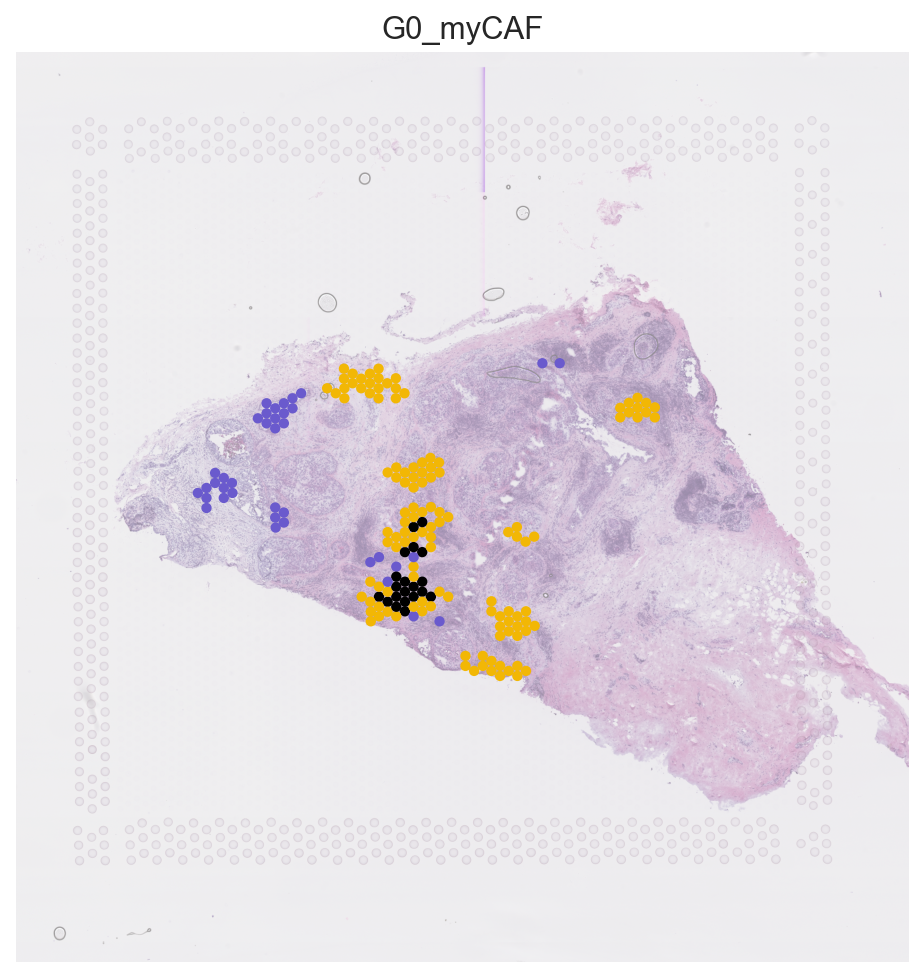

In [23]:
plot_multiple_hotspots(
    adata,
    signatures=["G0_arrested_hot", "CAFs myCAF like s4_hot"],
    combined_col="G0_myCAF",
    palette={
        "G0_arrested_hot": "#6A5ACD",
        "CAFs myCAF like s4_hot": "#F2B705",
        "CAFs myCAF like s4_hot+G0_arrested_hot": "#000000",
    },
    plot_kwargs={
        "library_id": "0",
        "library_key": "batch",
        "figsize": (6, 6),
        "img_alpha": 0.5,
        "legend_loc": None,
        "size": 1.6,
        "save": "spottedpy_G0_myCAF.pdf",
    },
)

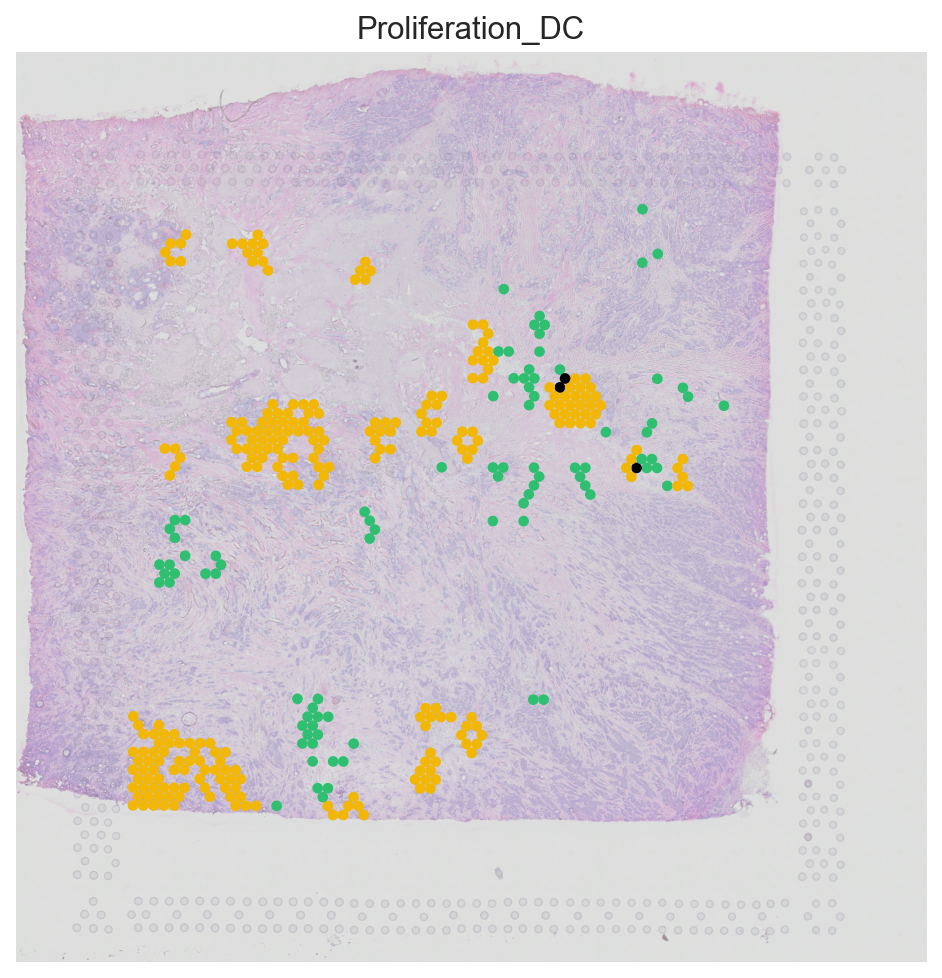

In [24]:
plot_multiple_hotspots(
    adata,
    signatures=["Fast_cycling_hot", "Myeloid_c3_cDC1_CLEC9A_hot"],
    combined_col="Proliferation_DC",
    palette={
        "Fast_cycling_hot": "#2FBF71",
        "Myeloid_c3_cDC1_CLEC9A_hot": "#F2B705",
        "Fast_cycling_hot+Myeloid_c3_cDC1_CLEC9A_hot": "#000000",
    },
    plot_kwargs={
        "library_id": "4",
        "library_key": "batch",
        "figsize": (6, 6),
        "img_alpha": 0.5,
        "legend_loc": None,
        "size": 1.6,
        "save": "spottedpy_Proliferation_DC.pdf",
    },
)

### Signatures

In [25]:
# Signature labels
signature_labels = [
    "Hypoxia_hallmarks",
    "Angiogenesis_hallmarks",
    "EMT_hallmarks",
    "Hybrid_EMT",
    "Mesenchymal",
    "Epithelial",
    "UPR_hallmarks",
    "IRE1_pathway",
    "PERK_pathway",
    "ATF6_pathway",
    "Semaphorin_Plexin",
    "Necrosis",
    "Apoptosis",
    "Complement",
    "Exhaustion"
]

quiescence_labels = ["G0_arrested","Fast_cycling", "Slow_cycling"]

In [26]:
# List of hypoxia hallmark genes
Hypoxia_hallmarks = [
    "ADM", "ADORA2B", "AK4", "AKAP12", "ALDOA", "ALDOB", "ALDOC", "AMPD3", "ANGPTL4", "ANKZF1", "ANXA2", "ATF3", "ATP7A", "B3GALT6", "B4GALNT2",
    "BCAN", "BCL2", "BGN", "BHLHE40", "BNIP3L", "BRS3", "BTG1", "CA12", "CASP6", "CAV1", "CCNG2", "CCRN4L", "CDKN1A", "CDKN1B", "CDKN1C",
    "CHST2", "CHST3", "CITED2", "COL5A1", "CP", "CSRP2", "CTGF", "CXCR4", "CXCR7", "CYR61", "DCN", "DDIT3", "DDIT4", "DPYSL4", "DTNA", "DUSP1",
    "EDN2", "EFNA1", "EFNA3", "EGFR", "ENO1", "ENO2", "ENO3", "ERO1L", "ERRFI1", "ETS1", "EXT1", "F3", "FAM162A", "FBP1", "FOS", "FOSL2",
    "FOXO3", "GAA", "GALK1", "GAPDH", "GAPDHS", "GBE1", "GCK", "GCNT2", "GLRX", "GPC1", "GPC3", "GPC4", "GPI", "GRHPR", "GYS1", "HAS1",
    "HDLBP", "HEXA", "HK1", "HK2", "HMOX1", "HOXB9", "HS3ST1", "HSPA5", "IDS", "IER3", "IGFBP1", "IGFBP3", "IL6", "ILVBL", "INHA", "IRS2",
    "ISG20", "JMJD6", "JUN", "KDELR3", "KDM3A", "KIF5A", "KLF6", "KLF7", "KLHL24", "LALBA", "LARGE", "LDHA", "LDHC", "LOX", "LXN", "MAFF",
    "MAP3K1", "MIF", "MT1E", "MT2A", "MXI1", "MYH9", "NAGK", "NCAN", "NDRG1", "NDST1", "NDST2", "NEDD4L", "NFIL3", "NR3C1", "P4HA1",
    "P4HA2", "PAM", "PCK1", "PDGFB", "PDK1", "PDK3", "PFKFB3", "PFKL", "PFKP", "PGAM2", "PGF", "PGK1", "PGM1", "PGM2", "PHKG1", "PIM1",
    "PKLR", "PKP1", "PLAC8", "PLAUR", "PLIN2", "PNRC1", "PPARGC1A", "PPFIA4", "PPP1R15A", "PPP1R3C", "PRDX5", "PRKCA", "PRKCDBP", "PTRF",
    "PYGM", "RBPJ", "RORA", "RRAGD", "S100A4", "SAP30", "SCARB1", "SDC2", "SDC3", "SDC4", "SELENBP1", "SERPINE1", "SIAH2", "SLC25A1", "SLC2A1",
    "SLC2A3", "SLC2A5", "SLC37A4", "SLC6A6", "SRPX", "STBD1", "STC1", "STC2", "SULT2B1", "TES", "TGFB3", "TGFBI", "TGM2", "TIPARP", "TKTL1",
    "TMEM45A", "TNFAIP3", "TPBG", "TPD52", "TPI1", "TPST2", "UGP2", "VEGFA", "VHL", "VLDLR", "WISP2", "WSB1", "XPNPEP1", "ZFP36", "ZNF292"
]

# List of angiogenesis hallmark genes
Angiogenesis_hallmarks = [
    "APOH", "APP", "CCND2", "COL3A1", "COL5A2", "CXCL6", "FGFR1", "FSTL1", "ITGAV", "JAG1", "JAG2", "KCNJ8", "LPL", "LRPAP1", "LUM", "MSX1",
    "NRP1", "OLR1", "PDGFA", "PF4", "PGLYRP1", "POSTN", "PRG2", "PTK2", "S100A4", "SERPINA5", "SLCO2A1", "SPP1", "STC1", "THBD", "TIMP1",
    "TNFRSF21", "VAV2", "VCAN", "VEGFA", "VTN"
]

# List of epithelial-mesenchymal transition (EMT) hallmark genes
EMT_hallmarks = [
    "ABI3BP", "ACTA2", "ADAM12", "ANPEP", "APLP1", "AREG", "BASP1", "BDNF", "BGN", "BMP1", "CADM1", "CALD1", "CALU", "CAP2", "CAPG", "CD44", "CD59",
    "CDH11", "CDH2", "CDH6", "COL11A1", "COL12A1", "COL16A1", "COL1A1", "COL1A2", "COL3A1", "COL4A1", "COL4A2", "COL5A1", "COL5A2", "COL5A3",
    "COL6A2", "COL6A3", "COL7A1", "COL8A2", "COMP", "COPA", "CRLF1", "CTGF", "CTHRC1", "CXCL1", "CXCL12", "CXCL6", "CYR61", "DAB2", "DCN", "DKK1",
    "DPYSL3", "DST", "ECM1", "ECM2", "EDIL3", "EFEMP2", "ELN", "EMP3", "ENO2", "FAP", "FAS", "FBLN1", "FBLN2", "FBLN5", "FBN1", "FBN2",
    "FERMT2", "FGF2", "FLNA", "FMOD", "FN1", "FOXC2", "FSTL1", "FSTL3", "FUCA1", "FZD8", "GADD45A", "GADD45B", "GAS1", "GEM", "GJA1", "GLIPR1",
    "GLT25D1", "GPC1", "GPX7", "GREM1", "HTRA1", "ID2", "IGFBP2", "IGFBP3", "IGFBP4", "IL15", "IL32", "IL6", "IL8", "INHBA", "ITGA2", "ITGA5",
    "ITGAV", "ITGB1", "ITGB3", "ITGB5", "JUN", "LAMA1", "LAMA2", "LAMA3", "LAMC1", "LAMC2", "LEPRE1", "LGALS1", "LOX", "LOXL1", "LOXL2",
    "LRP1", "LRRC15", "LUM", "MAGEE1", "MATN2", "MATN3", "MCM7", "MEST", "MFAP5", "MGP", "MMP1", "MMP14", "MMP2", "MMP3", "MSX1", "MXRA5",
    "MYL9", "MYLK", "NID2", "NNMT", "NOTCH2", "NT5E", "NTM", "OXTR", "PCOLCE", "PCOLCE2", "PDGFRB", "PDLIM4", "PFN2", "PLAUR", "PLOD1",
    "PLOD2", "PLOD3", "PMEPA1", "PMP22", "POSTN", "PPIB", "PRRX1", "PRSS2", "PTHLH", "PTX3", "PVR", "QSOX1", "RGS4", "RHOB", "SAT1",
    "SCG2", "SDC1", "SDC4", "SERPINE1", "SERPINE2", "SERPINH1", "SFRP1", "SFRP4", "SGCB", "SGCD", "SGCG", "SLC6A8", "SLIT2", "SLIT3",
    "SNAI2", "SNTB1", "SPARC", "SPOCK1", "SPP1", "TAGLN", "TFPI2", "TGFB1", "TGFBI", "TGFBR3", "TGM2", "THBS1", "THBS2", "THY1","TIMP1",
    "TIMP3", "TNC", "TNFAIP3", "TNFRSF11B", "TNFRSF12A", "TPM1", "TPM2", "TPM4", "VCAM1", "VCAN", "VEGFA", "VEGFC", "VIM", "WIPF1", "WNT5A"
]

# pEMT, E and M lists from Malagoli Tagliazucchi, G. et al. (2023) Nat Commun https://doi.org/10.1038/s41467-023-36439-7
Hybrid_EMT = ["PDPN", "ITGA5", "ITGA6", "TGFBI", "LAMC2", "MMP10", "LAMA3", "CDH13", "SERPINE1", "P4HA2", "TNC", "MMP1"]

Mesenchymal = ["VIM", "FOXC2", "SNAI1", "SNAI2", "TWIST1", "FN1", "ITGB6", "MMP2", "MMP3", "MMP9", "SOX10", "GCS", "ZEB1", "ZEB2", "TWIST2"]

Epithelial = ["CDH1", "DSP", "OCLN", "CRB3"]

# List of endoplasmic reticulum (ER) stress response genes
UPR_hallmarks = [
    "ALDH18A1", "ARFGAP1", "ASNS", "ATF3", "ATF4", "ATF6", "ATP6V0D1", "BAG3", "BANF1", "CALR", "CCL2", "CEBPB", "CEBPG", "CHAC1", "CKS1B",
    "CNOT2", "CNOT4", "CNOT6", "CXXC1", "DCP1A", "DCP2", "DCTN1", "DDIT4", "DDX10", "DKC1", "DNAJA4", "DNAJB9", "DNAJC3", "EDC4", "EDEM1", 
    "EEF2", "EIF2AK3", "EIF2S1", "EIF4A1", "EIF4A2", "EIF4A3", "EIF4E", "EIF4EBP1", "EIF4G1", "ERN1", "ERO1L", "EXOC2", "EXOSC1", "EXOSC10",
    "EXOSC2", "EXOSC4", "EXOSC5", "EXOSC9", "FKBP14", "FUS", "GEMIN4", "GOSR2", "H2AFX", "HERPUD1", "HSP90B1", "HSPA5", "HSPA9", "HYOU1", 
    "IARS", "IFIT1", "IGFBP1", "IMP3", "KDELR3", "KHSRP", "KIF5B", "LSM1", "LSM4", "MTHFD2", "NFYA", "NFYB", "NHP2", "NOLC1", "NOP14", 
    "NOP56", "NPM1", "OBFC2A", "PAIP1", "PARN", "PDIA5", "PDIA6", "POP4", "PREB", "PSAT1", "RPS14", "RRP9", "SDAD1", "SEC11A", "SEC31A", 
    "SERP1", "SHC1", "SKIV2L2", "SLC1A4", "SLC30A5", "SLC7A5", "SPCS1", "SPCS3", "SRPR", "SRPRB", "SSR1", "STC2", "TARS", "TATDN2", "TSPYL2", 
    "TTC37", "TUBB2A", "VEGFA", "WFS1", "WIPI1", "XBP1", "XPOT", "YIF1A", "YWHAZ", "ZBTB17"
]

IRE1_pathway = [
    "AGR2", "BAK1", "BAX", "BCL2L11", "BFAR", "COPS5", "DAB2IP", "DDRGK1", "DNAJB9", "ERN1", "ERN2", "FICD", "HSPA5", "PARP16", "PTPN1",
    "TMEM33", "UFL1", "VAPB", "XBP1"
]

PERK_pathway = [
    "ABCA7", "AGR2", "ATF4", "BOK", "DDIT3", "EIF2AK3", "EIF2S1", "HSPA5", "NCK1", "NCK2", "NFE2L2", "PPP1R15A", "PPP1R15B", "PTPN1",
    "PTPN2", "QRICH1", "TMED2", "TMEM33"
]

ATF6_pathway = ["ATF6", "ATF6B", "DDIT3", "HSPA5", "MBTPS1", "MBTPS2", "WFS1"]

Semaphorin_Plexin = [
    "PLXNC1", "SEMA3A", "SEMA6C", "SEMA6B", "SEMA4F", "SEMA4D", "SEMA4B", "SEMA3C", "ECE1", "EDN1", "EDNRA", "ERBB2", "SEMA3D",
    "PLXND1", "FLNA", "SH3BP1", "PLXNB2", "GDNF", "KDR", "RHOA", "ARHGDIA", "MET", "NCAM1", "PLXNA1", "PLXNA2", "PLXNB1", "PLXNB3",
    "SEMA5B", "SEMA4C", "PLXNA3", "SEMA3G", "SEMA6A", "SEMA4G", "RAC1", "SEMA3F", "SEMA4A", "SEMA3B", "SEMA6D", "SEMA7A", "NRP2",
    "NRP1", "SEMA5A", "PLXNA4", "HAND2", "SEMA3E", "FARP2"
]

Necrosis = ["RIPK3", "MLKL", "FAS", "FASLG", "TLR3", "TNF", "RIPK1", "FADD"]

Apoptosis = [
    "AKT3", "IRAK3", "CHP1", "CHUK", "CSF2RB", "DFFA", "DFFB", "ENDOG", "AKT1", "AKT2", "ENDOD1", "PIK3R5", "APAF1", "BIRC2", "BIRC3", "XIAP", "FAS",
    "IKBKB", "IL1A", "IL1B", "IL1R1", "IL1RAP", "FASLG", "IL3", "IL3RA", "IRAK1", "IRAK2", "MYD88", "ATM", "NFKB1", "NFKBIA", "NGF", "NTRK1", "IRAK4",
    "PIK3CA", "PIK3CB", "PIK3CD", "PIK3CG", "PIK3R1", "PIK3R2", "CYCS", "PPP3CA", "PPP3CB", "PPP3CC", "PPP3R1", "PPP3R2", "PRKACA", "PRKACB", "PRKACG",
    "PRKAR1A", "PRKAR1B", "PRKAR2A", "PRKAR2B", "PRKX", "BAD", "BAX", "BCL2", "RELA", "BCL2L1", "BID", "CHP2", "TNF", "TNFRSF1A", "TP53", "TRAF2",
    "CAPN1", "CAPN2", "CASP3", "CASP6", "CASP7", "CASP8", "CASP9", "CASP10", "PIK3R3", "IKBKG", "TRADD", "RIPK1", "TNFSF10", "FADD", "TNFRSF10D",
    "TNFRSF10C", "TNFRSF10B", "TNFRSF10A", "CFLAR", "MAP3K14", "AIFM1", "EXOG"
]

Complement = [
    "ACTN2", "ADAM9", "ADRA2B", "AKAP10", "ANG", "ANXA5", "APOA4", "APOBEC3F", "APOBEC3G", 
    "APOC1", "ATOX1", "BRPF3", "C1QA", "C1QC", "C1R", "C1S", "C2", "C3", "C4BPB", "C9", 
    "CA2", "CALM1", "CALM3", "CASP1", "CASP10", "CASP3", "CASP4", "CASP5", "CASP7", "CASP9", 
    "CBLB", "CCL5", "CD36", "CD40LG", "CD46", "CD55", "CD59", "CDA", "CDH13", "CDK5R1", 
    "CEBPB", "CFB", "CFH", "CLU", "COL4A2", "CP", "CPM", "CR1", "CR2", "CSRP1", "CTSB", 
    "CTSC", "CTSD", "CTSH", "CTSL", "CTSV", "CTSO", "CTSS", "CXCL1", "DGKG", "DGKH", 
    "DOCK10", "DOCK4", "DOCK9", "DPP4", "DUSP5", "DUSP6", "DYRK2", "EHD1", "ERAP2", "F10", 
    "F2", "F3", "F5", "F7", "F8", "FCER1G", "FCN1", "FDX1", "FN1", "FYN", "GATA3", "GCA", 
    "GMFB", "GNAI2", "GNAI3", "GNB2", "GNB4", "GNG2", "GNGT2", "GP1BA", "GP9", "GPD2", 
    "GRB2", "GZMA", "GZMB", "GZMK", "HNF4A", "HPCAL4", "HSPA1A", "HSPA5", "IL6", "IRF1", 
    "IRF2", "IRF7", "ITGAM", "ITIH1", "JAK2", "KCNIP2", "KCNIP3", "KIF2A", "KLK1", "KLKB1", 
    "KYNU", "L3MBTL4", "LAMP2", "LAP3", "LCK", "LCP2", "LGALS3", "LGMN", "LIPA", "LRP1", 
    "LTA4H", "LTF", "LYN", "MAFF", "ME1", "MMP12", "MMP13", "MMP14", "MMP15", "MMP8", 
    "MT3", "NOTCH4", "OLR1", "PCLO", "PCSK9", "PDGFB", "PDP1", "PFN1", "CPQ", "PHEX", 
    "PIK3CA", "PIK3CG", "PIK3R5", "PIM1", "PLA2G4A", "PLA2G7", "PLAT", "PLAUR", "PLEK", 
    "PLG", "PLSCR1", "PPP2CB", "PPP4C", "PRCP", "PRDM4", "PREP", "PRKCD", "PRSS3", 
    "PRSS36", "PSEN1", "PSMB9", "RABIF", "RAF1", "RASGRP1", "RCE1", "RHOG", "RNF4", 
    "S100A12", "S100A13", "S100A9", "SCG3", "MSRB1", "SERPINA1", "SERPINB2", "SERPINC1", 
    "SERPINE1", "SERPING1", "SH2B3", "SIRT6", "SPOCK2", "SRC", "STX4", "TFPI2", "TIMP1", 
    "TIMP2", "TMPRSS6", "TNFAIP3", "USP14", "USP15", "USP16", "USP8", "VCPIP1", "WAS", 
    "XPNPEP1", "ZEB1", "ZFPM2", "RBSN"
]

# List of exhausted T cell genes
Exhaustion = [
    "CTLA4", "PDCD1", "TIGIT", "LAG3", "HAVCR2", "EOMES", "TBX21", "BTLA", "CD274", "PTGER4", "CD244", "CD160"
]

Suppression = [
    "PDCD1", "CD274", "PDCD1LG2", "CD276", "TNFRSF4", "TNFSF4", "TNFRSF9", 
    "HAVCR2", "LAG3", "CTLA4", "FAP", "PDGFRB", "CD163", "SIGLEC1", "IL10", 
    "CCL2", "CCL8", "CCL13", "INHBA", "VCAN", "AXL", "TWIST2", "ADAM12", 
    "COL6A3", "STC1", "ISG15", "BCAT1", "OLFML2B"
]

Checkpoint = [
    "STAT1", "CCR5", "CXCL9", "CXCL10", "CXCL11", "PRF1", "GZMA", "HLA-DRA", 
    "CD274", "BTLA", "CD86", "LGALS9", "IDO1", "CTLA4", "ICOS", "PDCD1", "LAG3", 
    "HLA-A", "HLA-C", "HLA-B", "HLA-F", "HLA-DQA1", "HLA-DQB1", "ICOSLG", 
    "TNFRSF18", "TDO2", "PVR", "IFNG"
]

# filter upregulated genes for those that are in the adata.var_names
Hypoxia_hallmarks = [gene for gene in Hypoxia_hallmarks if gene in adata.var_names]
Angiogenesis_hallmarks = [gene for gene in Angiogenesis_hallmarks if gene in adata.var_names]
EMT_hallmarks = [gene for gene in EMT_hallmarks if gene in adata.var_names]
Hybrid_EMT = [gene for gene in Hybrid_EMT if gene in adata.var_names]
Mesenchymal = [gene for gene in Mesenchymal if gene in adata.var_names]
Epithelial = [gene for gene in Epithelial if gene in adata.var_names]
UPR_hallmarks = [gene for gene in UPR_hallmarks if gene in adata.var_names]
IRE1_pathway = [gene for gene in IRE1_pathway if gene in adata.var_names]
PERK_pathway = [gene for gene in PERK_pathway if gene in adata.var_names]
ATF6_pathway = [gene for gene in ATF6_pathway if gene in adata.var_names]
Semaphorin_Plexin = [gene for gene in Semaphorin_Plexin if gene in adata.var_names]
Necrosis = [gene for gene in Necrosis if gene in adata.var_names]
Apoptosis = [gene for gene in Apoptosis if gene in adata.var_names]
Complement = [gene for gene in Complement if gene in adata.var_names]
Exhaustion = [gene for gene in Exhaustion if gene in adata.var_names]
Suppression = [gene for gene in Suppression if gene in adata.var_names]
Checkpoint = [gene for gene in Checkpoint if gene in adata.var_names]

In [27]:
# Define a list of hallmarks and corresponding column names
hallmarks = [
    (Hypoxia_hallmarks, "Hypoxia_hallmarks"),
    (Angiogenesis_hallmarks, "Angiogenesis_hallmarks"),
    (EMT_hallmarks, "EMT_hallmarks"),
    (Hybrid_EMT, "Hybrid_EMT"),
    (Mesenchymal, "Mesenchymal"),
    (Epithelial, "Epithelial"),
    (UPR_hallmarks, "UPR_hallmarks"),
    (IRE1_pathway, "IRE1_pathway"),
    (PERK_pathway, "PERK_pathway"),
    (ATF6_pathway, "ATF6_pathway"),
    (Semaphorin_Plexin, "Semaphorin_Plexin"),
    (Necrosis, "Necrosis"),
    (Apoptosis, "Apoptosis"),
    (Complement, "Complement"),
    (Exhaustion, "Exhaustion"),
    (Suppression, "Suppression"),
    (Checkpoint, "Checkpoint")
]

# Process each batch and calculate scores
for batch in adata.obs["batch"].unique():
    batch_subset = adata[adata.obs["batch"] == batch]
    
    for hallmark_genes, score_name in hallmarks:
        # Calculate scores for the hallmark genes
        sc.tl.score_genes(batch_subset, hallmark_genes, score_name=score_name)
        
        # Update the scores in the main dataframe
        adata.obs.loc[adata.obs["batch"] == batch, score_name] = batch_subset.obs[score_name].values

In [28]:
scale_scores(adata, signature_labels)

In [29]:
tumour_signature_labels = [
    "Semaphorin_Plexin",
    "Hybrid_EMT",
    "Mesenchymal",
    "Epithelial",
    "UPR_hallmarks",
    "IRE1_pathway",
    "PERK_pathway",
    "ATF6_pathway",
    "Complement",
]

adata = calculate_hotspots(adata, [label for label in signature_labels if label not in tumour_signature_labels])
adata = calculate_hotspots(adata, tumour_signature_labels, filter_columns="tumour_cells", filter_value=1)

100%|██████████| 9/9 [01:19<00:00,  8.82s/it]


In [30]:
signature_labels_hotspots = [label + "_hot" for label in signature_labels]

In [31]:
# Define primary and comparison variables
primary_variables = ["G0_arrested_hot", "Fast_cycling_hot"]
comparison_variables = signature_labels_hotspots

# Calculate distances
distances = sp.calculateDistances(
    adata,
    primary_variables=primary_variables,
    comparison_variables=comparison_variables,
    empty_hotspot_default_to_max_distance=False,
    split_by_slide_in_batch=True,
    hotspot_number=True,
)

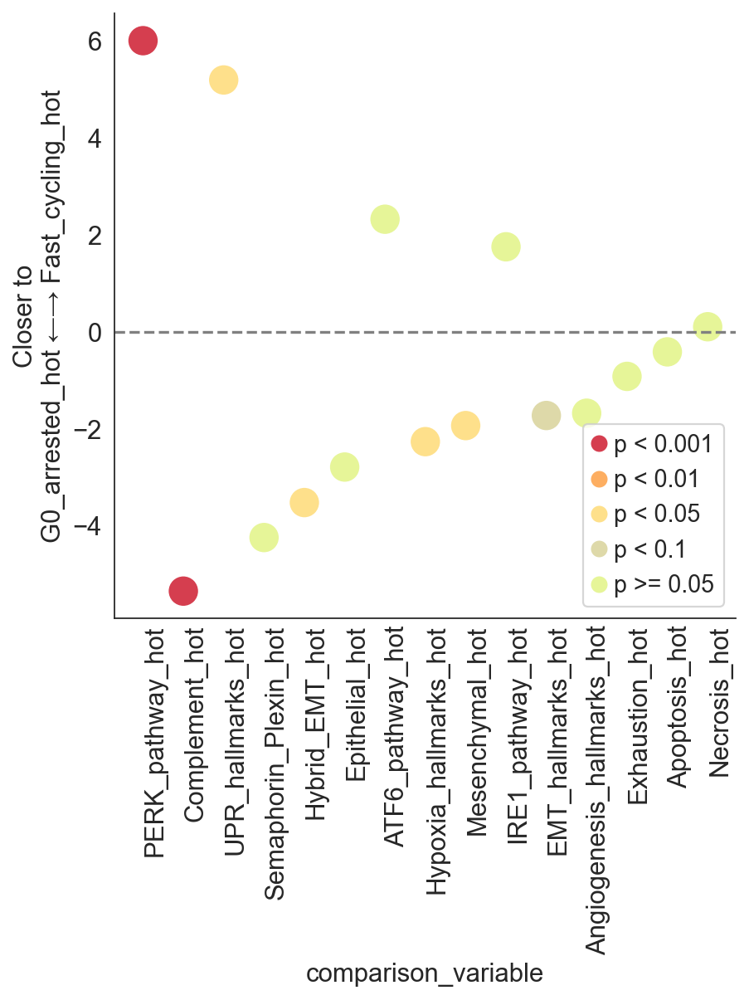

In [32]:
sp.plot_custom_scatter(
    data=distances,
    primary_vars=["G0_arrested_hot", "Fast_cycling_hot"],
    comparison_vars=signature_labels_hotspots,
    bubble_size=(300, 300),
    fig_size=(6, 6),
    save_path=None,
    compare_distribution_metric="median",
)

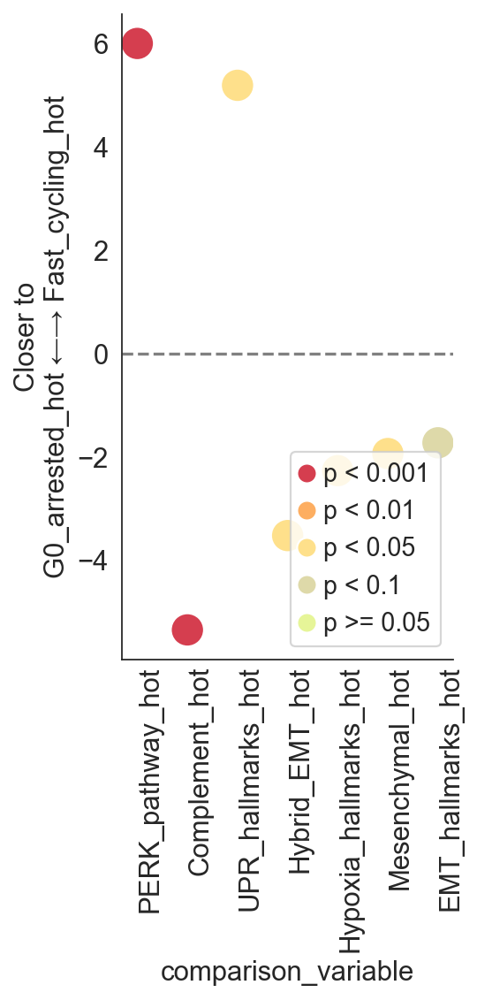

In [33]:
selected_signatures = [
    "PERK_pathway_hot",
    "Complement_hot",
    "UPR_hallmarks_hot",
    "Hybrid_EMT_hot",
    "Hypoxia_hallmarks_hot",
    "Mesenchymal_hot",
    "EMT_hallmarks_hot"
]

sp.plot_custom_scatter(
    data=distances,
    primary_vars=["G0_arrested_hot", "Fast_cycling_hot"],
    comparison_vars=selected_signatures,
    bubble_size=(300, 300),
    fig_size=(3, 6),
    save_path="figures/spottedpy_all_samples_signatures.pdf",
    compare_distribution_metric="median",
)

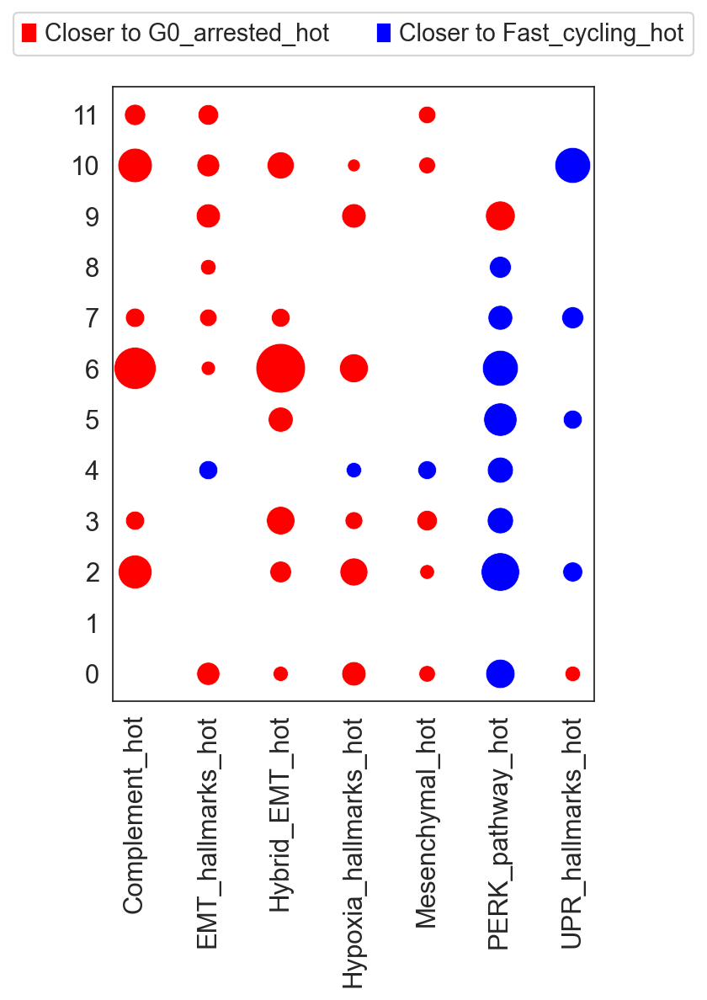

,primary_variable,comparison_variable,batch,min_distance,Difference,Pvalue
0,Fast_cycling_hot,Complement_hot,0,7.149505,0.000000,1.621786e-02
1,Fast_cycling_hot,Complement_hot,1,18.599441,0.000000,1.652397e-01
2,Fast_cycling_hot,Complement_hot,10,20.080226,0.000000,4.610776e-88
3,Fast_cycling_hot,Complement_hot,11,11.370877,0.000000,7.895003e-04
4,Fast_cycling_hot,Complement_hot,2,17.928767,0.000000,1.239674e-70
...,...,...,...,...,...,...
156,G0_arrested_hot,UPR_hallmarks_hot,4,12.585548,0.368868,7.192384e-01
157,G0_arrested_hot,UPR_hallmarks_hot,5,12.517111,5.066082,1.561177e-03
158,G0_arrested_hot,UPR_hallmarks_hot,6,2.425798,1.235849,5.165538e-02
159,G0_arrested_hot,UPR_hallmarks_hot,7,11.433990,6.815092,2.034607e-13


In [35]:
sp.plot_bubble_chart_by_batch(
    distances,
    primary_variable_value="G0_arrested_hot",
    comparison_variable_values=selected_signatures,
    reference_variable="Fast_cycling_hot",
    save_path="bubble_chart_by_batch_selected_signatures.pdf",
    pval_cutoff=0.05,
    fig_size=(5, 8),
)

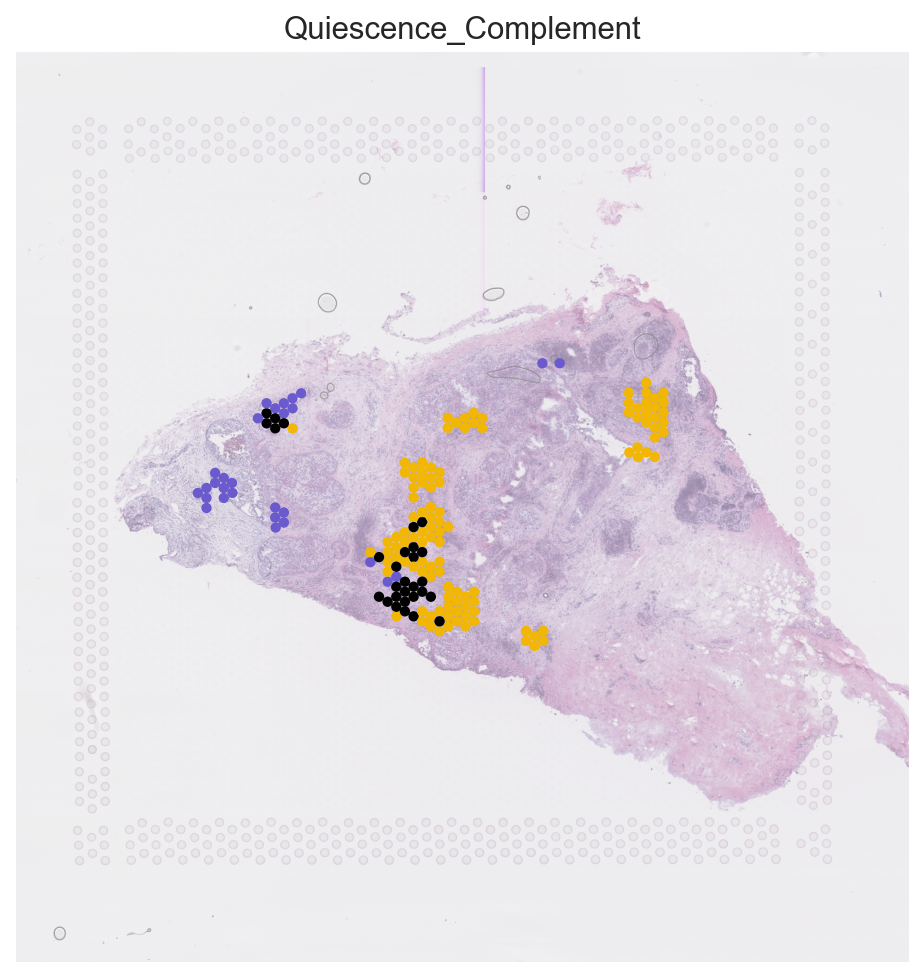

In [36]:
plot_multiple_hotspots(
    adata,
    signatures=["G0_arrested_hot", "Complement_hot"],
    combined_col="Quiescence_Complement",
    palette={
        "G0_arrested_hot": "#6A5ACD",
        "Complement_hot": "#F2B705",
        "Complement_hot+G0_arrested_hot": "#000000",
    },
    plot_kwargs={
        "library_id": "0",
        "library_key": "batch",
        "figsize": (6, 6),
        "img_alpha": 0.5,
        "legend_loc": None,
        "size": 1.6,
        "save": "spottedpy_Quiescence_Complement.pdf",
    },
)

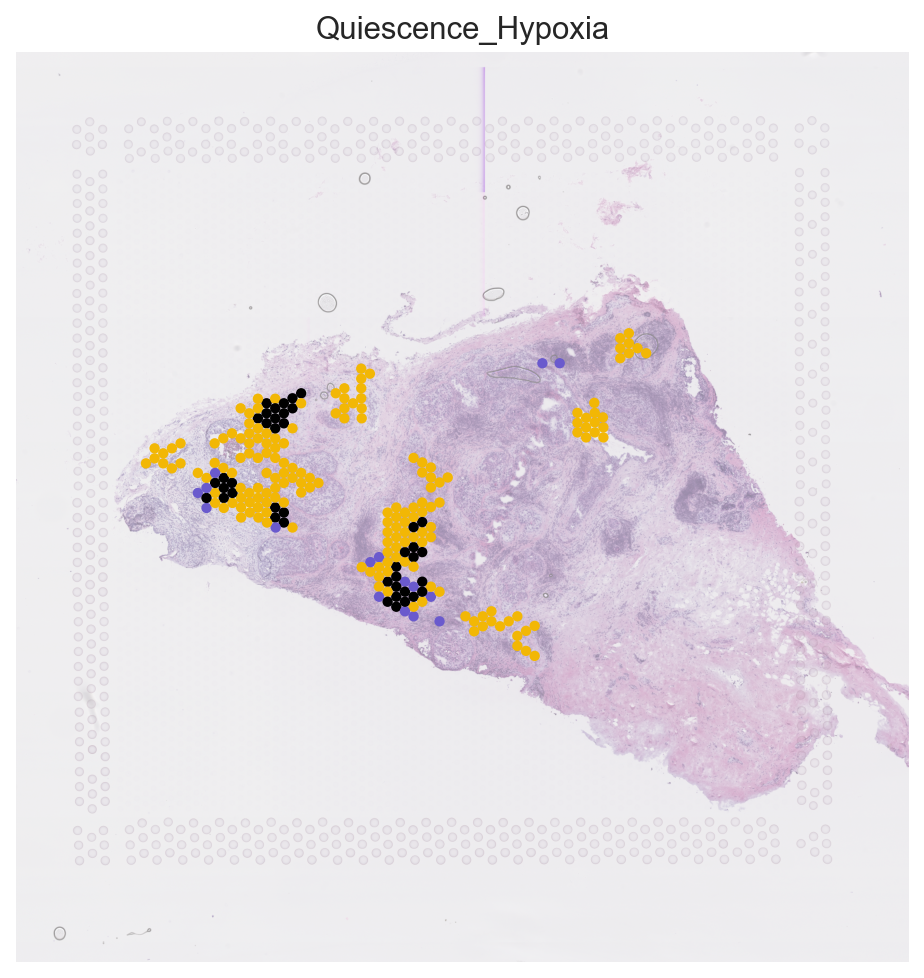

In [37]:
plot_multiple_hotspots(
    adata,
    signatures=["G0_arrested_hot", "Hypoxia_hallmarks_hot"],
    combined_col="Quiescence_Hypoxia",
    palette={
        "G0_arrested_hot": "#6A5ACD",
        "Hypoxia_hallmarks_hot": "#F2B705",
        "G0_arrested_hot+Hypoxia_hallmarks_hot": "#000000",
    },
    plot_kwargs={
        "library_id": "0",
        "library_key": "batch",
        "figsize": (6, 6),
        "img_alpha": 0.5,
        "legend_loc": None,
        "size": 1.6,
        "save": "spottedpy_Quiescence_Hypoxia.pdf",
    },
)

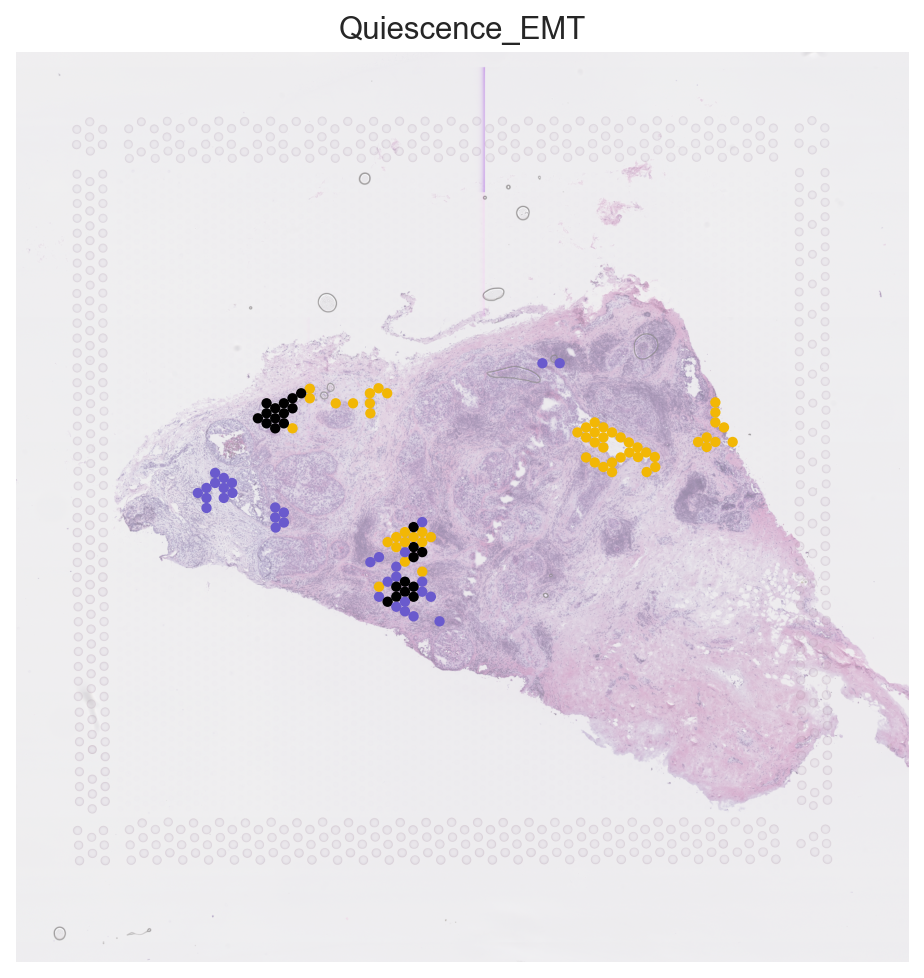

In [38]:
plot_multiple_hotspots(
    adata,
    signatures=["G0_arrested_hot", "Hybrid_EMT_hot"],
    combined_col="Quiescence_EMT",
    palette={
        "G0_arrested_hot": "#6A5ACD",
        "Hybrid_EMT_hot": "#F2B705",
        "G0_arrested_hot+Hybrid_EMT_hot": "#000000",
    },
    plot_kwargs={
        "library_id": "0",
        "library_key": "batch",
        "figsize": (6, 6),
        "img_alpha": 0.5,
        "legend_loc": None,
        "size": 1.6,
        "save": "spottedpy_Quiescence_Hybrid_EMT.pdf",
    },
)

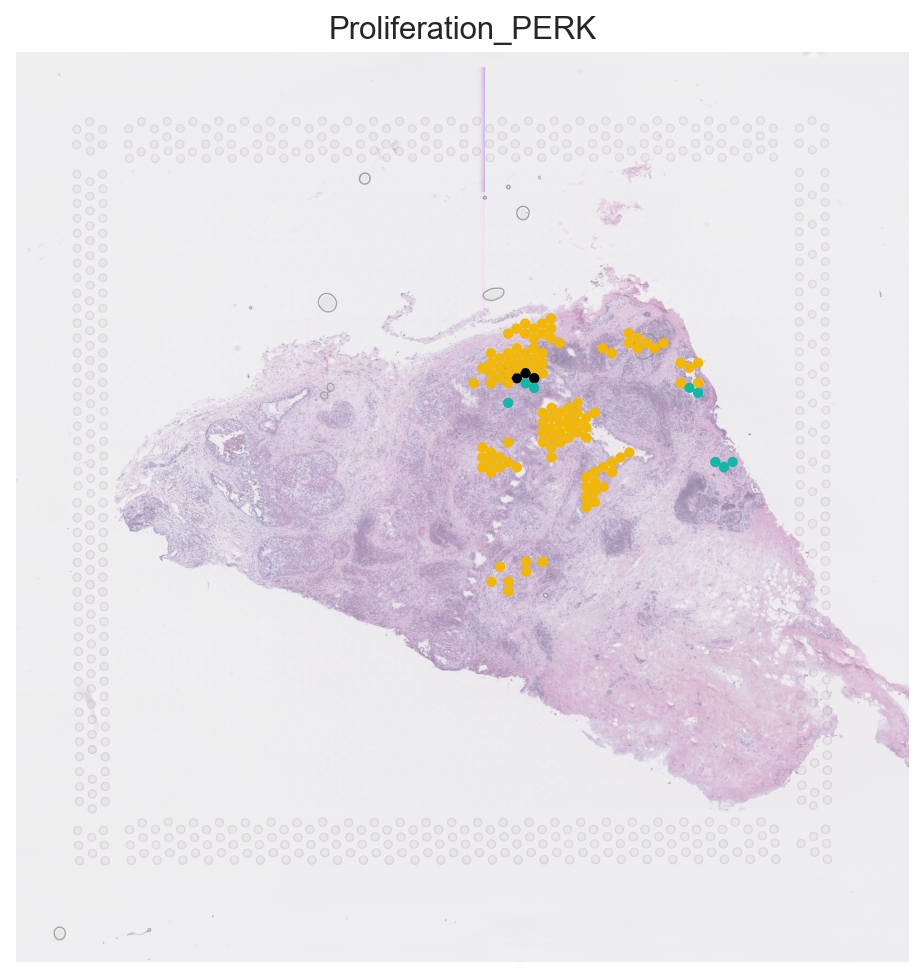

In [39]:
plot_multiple_hotspots(
    adata,
    signatures=["Fast_cycling_hot", "PERK_pathway_hot"],
    combined_col="Proliferation_PERK",
    palette={
        "Fast_cycling_hot": "#12B7A8",
        "PERK_pathway_hot": "#F2B705",
        "Fast_cycling_hot+PERK_pathway_hot": "#000000",
    },
    plot_kwargs={
        "library_id": "0",
        "library_key": "batch",
        "figsize": (6, 6),
        "img_alpha": 0.5,
        "legend_loc": None,
        "size": 1.6,
        "save": "spottedpy_Proliferation_PERK.pdf",
    },
)

In [40]:
adata.X = adata.layers["counts"].copy()

In [41]:
adata.write_h5ad("data/adata_with_signatures_and_hotspots.h5ad")